## 3rd Assignment: Social contagion

In this assignment you will investigate the social contagion in a network by implementing the networked coordination game as described this week (see the slides of the lecture).

#### Part 1: Use synthetic graphs
- In the first part of exercise you can use the synthetic graphs available in the networkx library.
-In order to see social contagion you need to generate a graph, define the payoff matrix and select the random nodes that start the contagion. 
<br>Since it can take some time to tune the parameters I recommend you to start with small graphs. The video below shows the contagion in the Zachary Karate Club we have discussed in class and you can start with this graph too. 

#### Part 2: Use your real graph
Reuse the code developed in Part 1 and see what happens with your real graph. Have fun!


In questa terza esercitazione andremo a vedere come si espande il contagio all'interno delle nostre reti.
<br>Questa contaminazione può riferirsi a malattie(in questo periodo soprattutto) come il Coronavirus; ma nel nostro grafo vogliamo considerare come una nuova innovazione (l'utilizzo della posta elettronica, di autenticazione a due fattori etc) possa diffondersi all'interno del DIBRIS. Questi sono veri e propri esempi di social contagion (anziché biological contagion): le persone sono portate ad effettuare una scelta se adottare la nuova idea oppure no.

Nel nostro caso la contaminazione è di tipo complessa: un nodo decide di adottare una soluzione solo se un treshold dei suoi vicini l'ha adottata. 

La nostra matrice di payoff: <br/>
A: Non adottare una nuova idea, a = 1 <br/>
B: Adottare la nuova idea, b = 3 <br/>

|   |  A  |  B  |
|---|-----|-----|
| A | 1,1 |  0  |
| B |  0  | 3,3 |


## Parte 1: synthetic graphs
In questa sezione andiamo ad analizzare un Erdös–Rényi random graph generato tramite networkx.

Utilizziamo questa sezione solo come test del nostro notebook, non andremo a fare eventuali valutazioni, e non testeremo su tutti i grafi creati nelle esercitazioni precedenti perché vogliamo andare ad analizzare meglio le situazioni sul grafo reale.

In [1]:
import networkx
graph = networkx.gnp_random_graph(50, 0.09, seed=42)

# Set contagion value to false
networkx.set_node_attributes(graph, False, 'contagion')

In [2]:
# Remove all images previously saved
import os
import glob

files = glob.glob('random_images/*')

for f in files:
    try:
        os.remove(f)
    except OSError as e:
        print("Error: %s : %s" % (f, e.strerror))

files = glob.glob('dibris_images/*')

for f in files:
    try:
        os.remove(f)
    except OSError as e:
        print("Error: %s : %s" % (f, e.strerror))



In [3]:
# Plot graph
import matplotlib.pyplot as plt

def plot_graph(G, title, path="./random_images/"):
    colors = list()
    for key, value in networkx.get_node_attributes(G, 'contagion').items():
        if value: 
            colors.append('red')
        else:
            colors.append('blue')
    networkx.draw(G, pos=networkx.spring_layout(G, k=0.15, iterations=20, seed=42), node_color=colors, node_size=30, arrowsize=2)
    plt.title(title)
    plt.draw()
    plt.savefig(path + title + '.png', dpi=500, bbox_inches = "tight")
    #plt.show()
    plt.close()

In [4]:
# Start contagiando nodi random
import random

random.seed(42)
def get_random_node(G):
    list_of_nodes = G.nodes()
    return random.sample(list_of_nodes, 1)[0]

for i in range(3):
    graph.nodes[get_random_node(graph)]['contagion'] = True

plot_graph(graph, "Random graph starting")

In [5]:
# Contagion
a = 1
b = 3
def contagion(G):
    for n in graph.nodes():
        # Quanti vicini
        n_vicini = len(list(set(G.edges(n))))
        if n_vicini == 0:
            continue
        
        puri = 0
        for nodo, arrivo in list(set(G.edges(n))):
            if not graph.nodes[arrivo]['contagion']:
                puri += 1
        p = puri / n_vicini # percentuali di vicini puri
        contagia = (1-p) * n_vicini * b
        non_contagia = p * n_vicini * a
        
        if contagia > non_contagia:
            G.nodes[n]['contagion'] = True

for i in range(5):
    contagion(graph)
    plot_graph(graph, "Random graph step " + str(i))
    

In [6]:
# Make gif 
import imageio
import os
def make_gif(png_dir, gif_name):
    images = []
    for file_name in sorted(os.listdir(png_dir)):
        if file_name.endswith('.png'):
            file_path = os.path.join(png_dir, file_name)
            images.append(imageio.imread(file_path))
    imageio.mimsave(gif_name, images, duration=1)

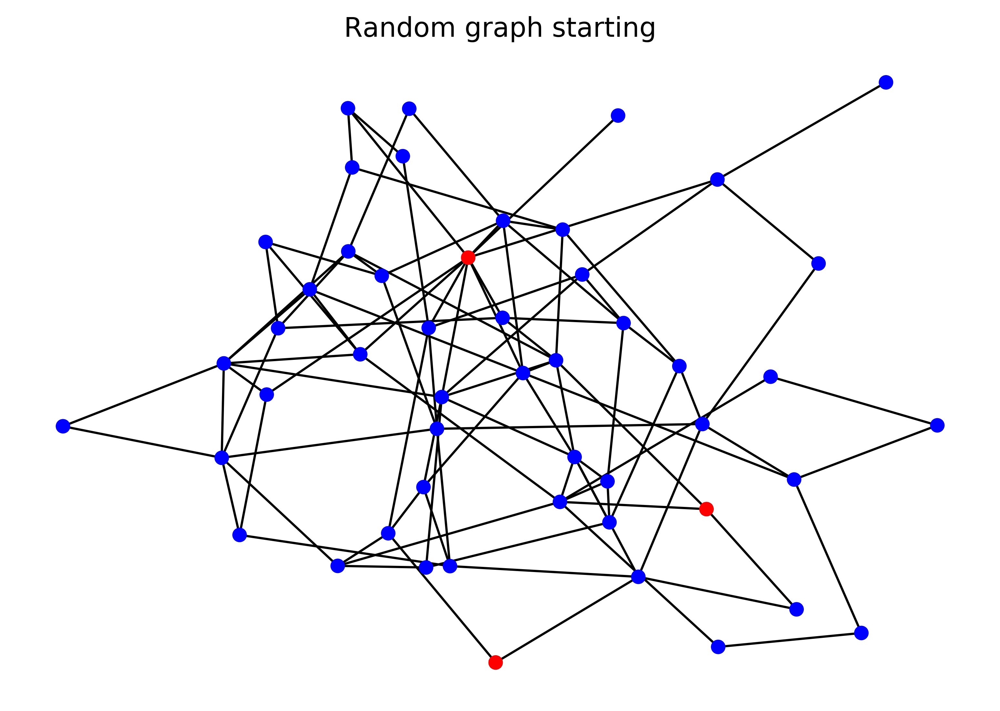

In [7]:
# Display gif
from IPython.display import Image
make_gif('./random_images/', './random_images/contagion.gif')
with open('./random_images/contagion.gif','rb') as file:
    display(Image(file.read()))


## Parte 2: dibris
In questa sezione andiamo ad analizzare il nostro grafo sulle collaborazione all'interno del DIBRIS.

Vogliamo fare due tipi di contagi: 
1. Il primo contagio parte da nodi random
2. Il secondo contagio invece parte da nodi ben precisi, che possono essere inseriti manualmente volta per volta per vedere come cambia lo spreading dell'utilizzo di una nuova tecnologia

Si possono fare numerose considerazioni riguardo a quanti nodi devono adottare inizialmente la nuova tecnologia e quali. Per evitare di fare una relazione con tutti i casi possibili abbiamo creato apposta questo notebook così si possono provare live tutti i vari casi. Abbiamo per esempio iniziato contagiando solo 3 nodi, questi in alcune computazioni permetteva poi espandere il contagio, in altre invece (come nel caso con seed=42) la nuova tecnologia non veniva utilizzata da tutta la rete e il contagio si fermava.

Nell'esempio di seguito quindi il numero di nodi da cui parte il contagio è 7

In [8]:
# Get the graph
graph = networkx.read_adjlist("../graphs/dibris_graph.txt")
# Set contagion value to false
networkx.set_node_attributes(graph, False, 'contagion')

In [9]:
# Start random contagion
for i in range(7):
    graph.nodes[get_random_node(graph)]['contagion'] = True

plot_graph(graph, "DIBRIS GRAPH starting", path="dibris_images/")

In [10]:
# Contagion
a = 1
b = 3
def contagion(G):
    for n in graph.nodes():
        # Quanti vicini
        n_vicini = len(list(set(G.edges(n))))
        if n_vicini == 0:
            continue
        
        puri = 0
        for nodo, arrivo in list(set(G.edges(n))):
            if not graph.nodes[arrivo]['contagion']:
                puri += 1
        p = puri / n_vicini
        contagia = (1-p) * n_vicini * b
        non_contagia = p * n_vicini * a
        
        if contagia > non_contagia:
            G.nodes[n]['contagion'] = True

for i in range(5):
    contagion(graph)
    plot_graph(graph, "DIBRIS GRAPH step " + str(i), path="dibris_images/")


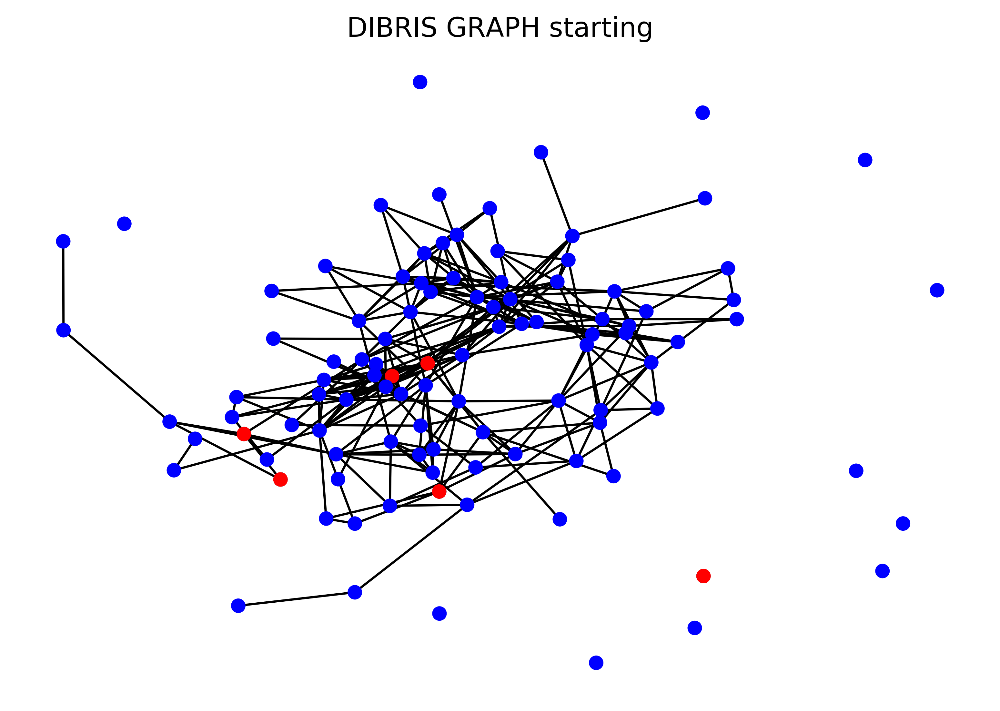

In [11]:
# Display gif
from IPython.display import Image
make_gif('./dibris_images/', './dibris_images/contagion.gif')
with open('./dibris_images/contagion.gif','rb') as file:
    display(Image(file.read()))


Questa ultima sezione è lasciata per effettuare esperimenti provando a contagiare inizialmente dei nodi "famosi" visti durante la prima esercitazione per vedere gli effetti sul grafo.

In [12]:
# Remove data
files = glob.glob('dibris_images/*')

for f in files:
    try:
        os.remove(f)
    except OSError as e:
        print("Error: %s : %s" % (f, e.strerror))


# Get the graph
graph = networkx.read_adjlist("../graphs/dibris_graph.txt")
# Set contagion value to false
networkx.set_node_attributes(graph, False, 'contagion')

In [13]:
# Start sniper contagion
# Start contagion from top 3 degree nodes (Mastrogiovanni, Odone, Ancona)
graph.nodes['9dRRzV0AAAAJ']['contagion'] = True
graph.nodes['riK7DscAAAAJ']['contagion'] = True
graph.nodes['mX7J33sAAAAJ']['contagion'] = True

plot_graph(graph, "DIBRIS GRAPH starting", path="dibris_images/")

In [14]:
# Contagion
a = 1
b = 3
def contagion(G):
    for n in graph.nodes():
        # Quanti vicini
        n_vicini = len(list(set(G.edges(n))))
        if n_vicini == 0:
            continue
        
        puri = 0
        for nodo, arrivo in list(set(G.edges(n))):
            if not graph.nodes[arrivo]['contagion']:
                puri += 1
        p = puri / n_vicini
        contagia = (1-p) * n_vicini * b
        non_contagia = p * n_vicini * a
        
        if contagia > non_contagia:
            G.nodes[n]['contagion'] = True

for i in range(5):
    contagion(graph)
    plot_graph(graph, "DIBRIS GRAPH step " + str(i), path="dibris_images/")


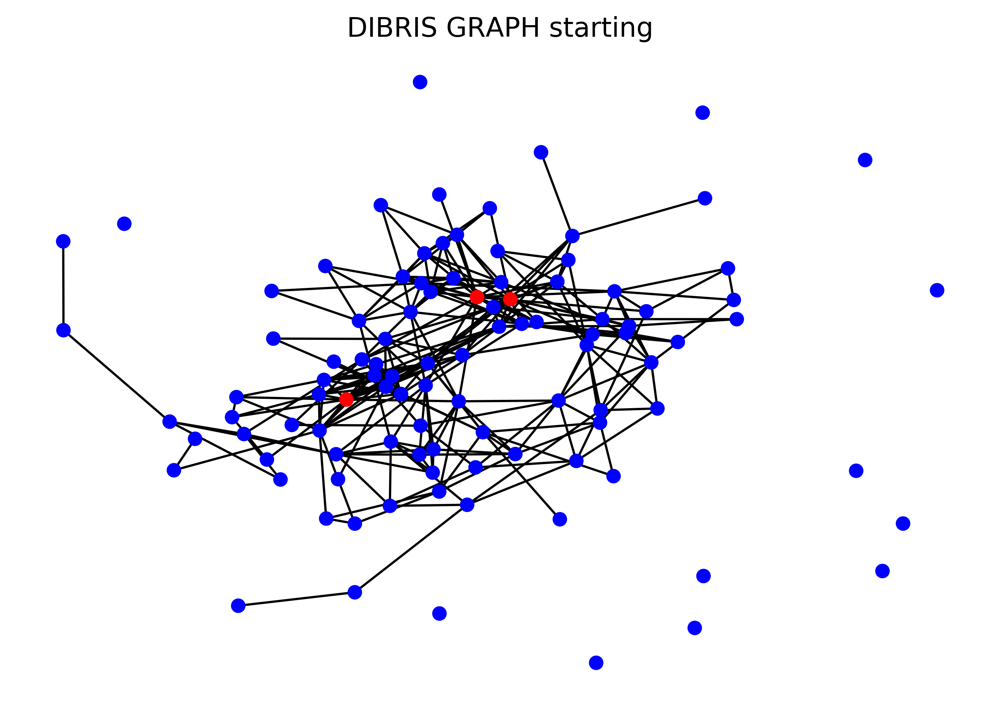

In [15]:
# Display gif
from IPython.display import Image
make_gif('./dibris_images/', './dibris_images/contagion.gif')
with open('./dibris_images/contagion.gif','rb') as file:
    display(Image(file.read()))
